### Order in which code is to be ran

Dataset_preprocessing.ipynb --->  EDA.ipynb ---> Feature_Engineering.ipynb ---> models.ipynb ----> models.ipynb ----> neural-network.ipynb

Many Dataset files will be created in running this code could'nt submit those file of 50 mb zip file limit

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
from tqdm import tqdm


In [3]:
import warnings
warnings.filterwarnings("ignore")


In [4]:
train_data = pd.read_csv('preprocessed-dataset/train.csv')


In [5]:
print("Initial DataFrame:")
print(train_data.head())


Initial DataFrame:
   Enrollment  Start Date Completion Date First Posted Results First Posted  \
0          36  2020-02-28      2021-01-28   2020-02-25                  NaN   
1         311  2018-02-16      2020-07-16   2018-02-08           2021-08-06   
2         111  2020-02-13      2022-10-27   2020-08-10                  NaN   
3         200  2018-12-22      2019-12-30   2020-07-01                  NaN   
4         111  2019-10-17      2022-03-29   2019-01-30           2023-03-15   

  Last Update Posted  Study Status_COMPLETED  \
0         2021-03-25                       1   
1         2021-08-06                       0   
2         2023-12-21                       1   
3         2021-10-01                       1   
4         2023-03-20                       0   

   Study Status_ENROLLING_BY_INVITATION  Study Status_NOT_YET_RECRUITING  \
0                                     0                                0   
1                                     0                          

In [6]:
print("\nSummary of the dataset:")
print(train_data.info())


Summary of the dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14473 entries, 0 to 14472
Data columns (total 50 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Enrollment                            14473 non-null  int64  
 1   Start Date                            14473 non-null  object 
 2   Completion Date                       14473 non-null  object 
 3   First Posted                          14473 non-null  object 
 4   Results First Posted                  5357 non-null   object 
 5   Last Update Posted                    14473 non-null  object 
 6   Study Status_COMPLETED                14473 non-null  int64  
 7   Study Status_ENROLLING_BY_INVITATION  14473 non-null  int64  
 8   Study Status_NOT_YET_RECRUITING       14473 non-null  int64  
 9   Study Status_RECRUITING               14473 non-null  int64  
 10  Study Status_SUSPENDED                14473 non-null  int

 It includes numerical data such as Enrollment numbers and Study Recruitment Rates, date fields like Start Date, Completion Date, and First Posted dates. Categorical variables are represented using one-hot encoding for features like Study Status (e.g., COMPLETED, RECRUITING), Sex (FEMALE, MALE), Age Groups (e.g., CHILD, ADULT, OLDER_ADULT), Study Phases, and Funder Types (e.g., INDUSTRY, NIH). The dataset also contains Sentiment Scores (float values) derived from textual fields such as Study Title, Brief Summary, and Conditions, providing insights into the sentiment of these descriptions. While most columns are complete, the Results First Posted column has missing values, indicating not all studies have posted results. Overall, the dataset offers a comprehensive view of clinical trial characteristics, suitable for analysis of trends, outcomes, and recruitment strategies.

In [7]:
print("\nStatistical summary of numerical columns:")
print(train_data.describe())


Statistical summary of numerical columns:
          Enrollment  Study Status_COMPLETED  \
count   14473.000000            14473.000000   
mean      242.367788                0.769709   
std      4144.486385                0.421034   
min         1.000000                0.000000   
25%        23.000000                1.000000   
50%        48.000000                1.000000   
75%       136.000000                1.000000   
max    477102.000000                1.000000   

       Study Status_ENROLLING_BY_INVITATION  Study Status_NOT_YET_RECRUITING  \
count                          14473.000000                     14473.000000   
mean                               0.000553                         0.000829   
std                                0.023505                         0.028784   
min                                0.000000                         0.000000   
25%                                0.000000                         0.000000   
50%                                0.000000 

The statistical summary shows that clinical trials have widely varying sizes and recruitment rates, with most being completed around 2020 but only some having results posted. Sentiment analysis suggests neutral descriptions, and the data highlights differences in enrollment and recruitment efficiency among studies.

In [8]:
print("\nMissing values in the dataset:")
print(train_data.isnull().sum())


Missing values in the dataset:
Enrollment                                 0
Start Date                                 0
Completion Date                            0
First Posted                               0
Results First Posted                    9116
Last Update Posted                         0
Study Status_COMPLETED                     0
Study Status_ENROLLING_BY_INVITATION       0
Study Status_NOT_YET_RECRUITING            0
Study Status_RECRUITING                    0
Study Status_SUSPENDED                     0
Study Status_TERMINATED                    0
Study Status_UNKNOWN                       0
Study Results_YES                          0
Sex_FEMALE                                 0
Sex_MALE                                   0
Age_ADULT, OLDER_ADULT                     0
Age_CHILD                                  0
Age_CHILD, ADULT                           0
Age_CHILD, ADULT, OLDER_ADULT              0
Age_OLDER_ADULT                            0
Phases_PHASE1|PHASE2   

Only the Results First Posted column has missing data, with 63% of entries lacking values, suggesting many studies haven't posted results. All other columns are complete, ensuring robustness in analyses that don't rely on this missing data. It's important to consider this when analyzing study outcomes to avoid bias and misinterpretation.

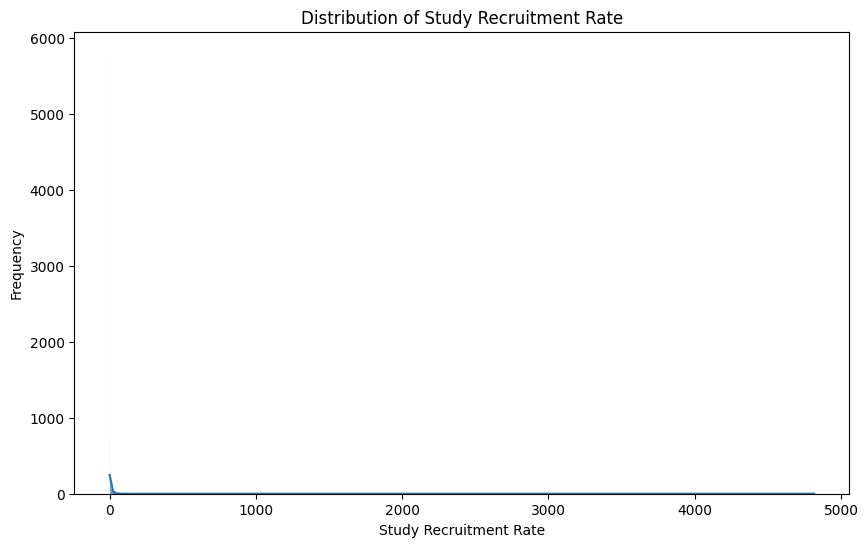

In [9]:
plt.figure(figsize=(10, 6))
sns.histplot(train_data['Study Recruitment Rate'], kde=True)
plt.title('Distribution of Study Recruitment Rate')
plt.xlabel('Study Recruitment Rate')
plt.ylabel('Frequency')
plt.show()

The distribution of the study recruitment rate is highly skewed, with most studies having low recruitment rates clustered near zero. A few studies have exceptionally high rates, creating a long tail on the right side of the distribution. This indicates that while most studies recruit participants slowly, a small number achieve very high recruitment rates.

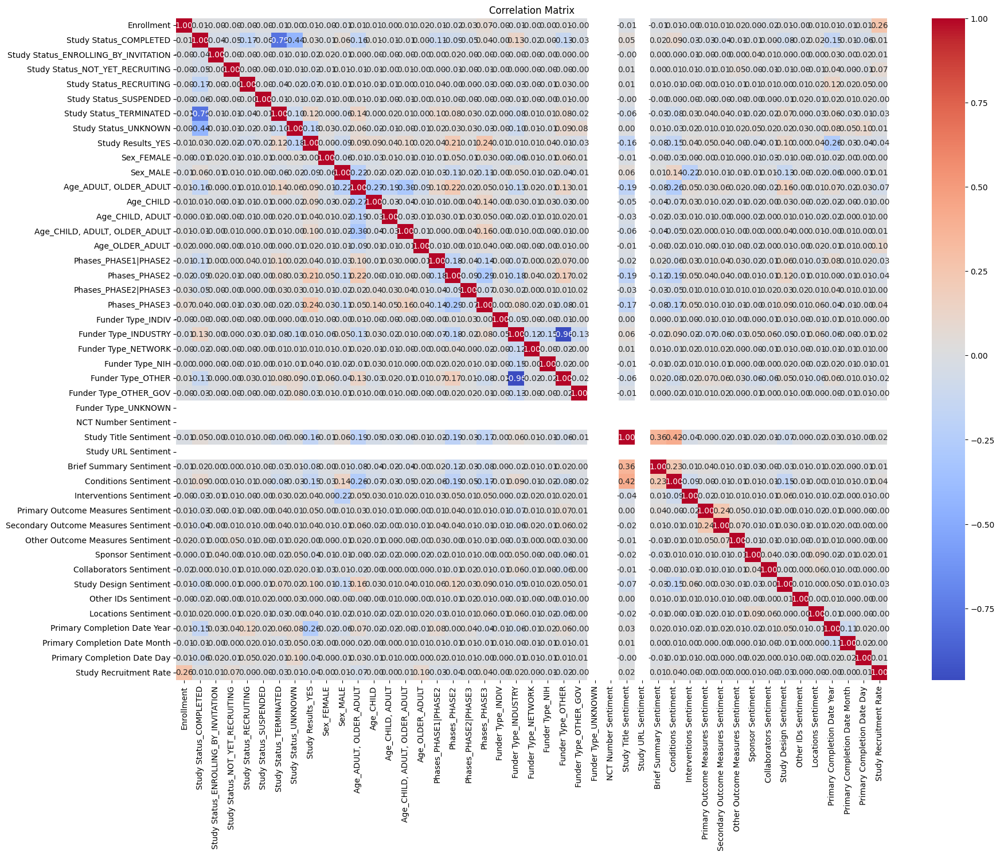

In [10]:
plt.figure(figsize=(20, 15))
numeric_columns = train_data.select_dtypes(include=[np.number]).columns.tolist()
correlation_matrix = train_data[numeric_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


The correlation matrix shows relationships between various features in the dataset. Most correlations are weak, indicated by values close to zero, suggesting limited linear relationships. Notable exceptions include strong correlations within study phases and funder types, reflecting expected associations.

In [11]:
sns.pairplot(train_data[numeric_columns])
plt.show()

Most pairplots show no correln between amoung but sme shows having a polynomial mixture can help better in traing the data

Generating Boxplots: 100%|██████████| 45/45 [00:07<00:00,  5.69it/s]


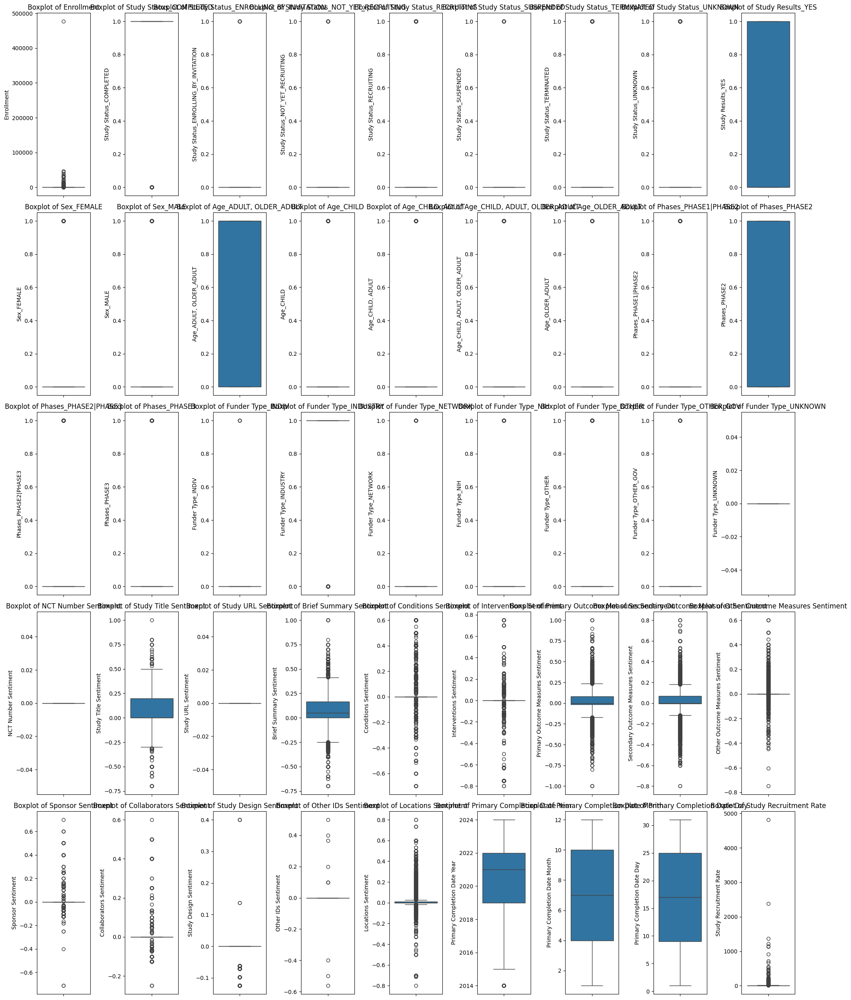

In [12]:
plt.figure(figsize=(20, 25))
for i, column in tqdm(enumerate(numeric_columns, 1), total=len(numeric_columns), desc="Generating Boxplots"):
    plt.subplot(5, 9, i)
    sns.boxplot(y=train_data[column])
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()


The boxplots illustrate the distribution of various dataset features. Most variables show a concentration of values with some outliers, particularly in enrollment and recruitment rates. Sentiment scores are generally centered around zero, indicating neutral sentiment, while categorical variables are mostly binary.

In [13]:
categorical_columns = train_data.select_dtypes(include=['object', 'category']).columns.tolist()



In [14]:
len(categorical_columns)

5

Generating Countplots: 100%|██████████| 5/5 [00:46<00:00,  9.35s/it]


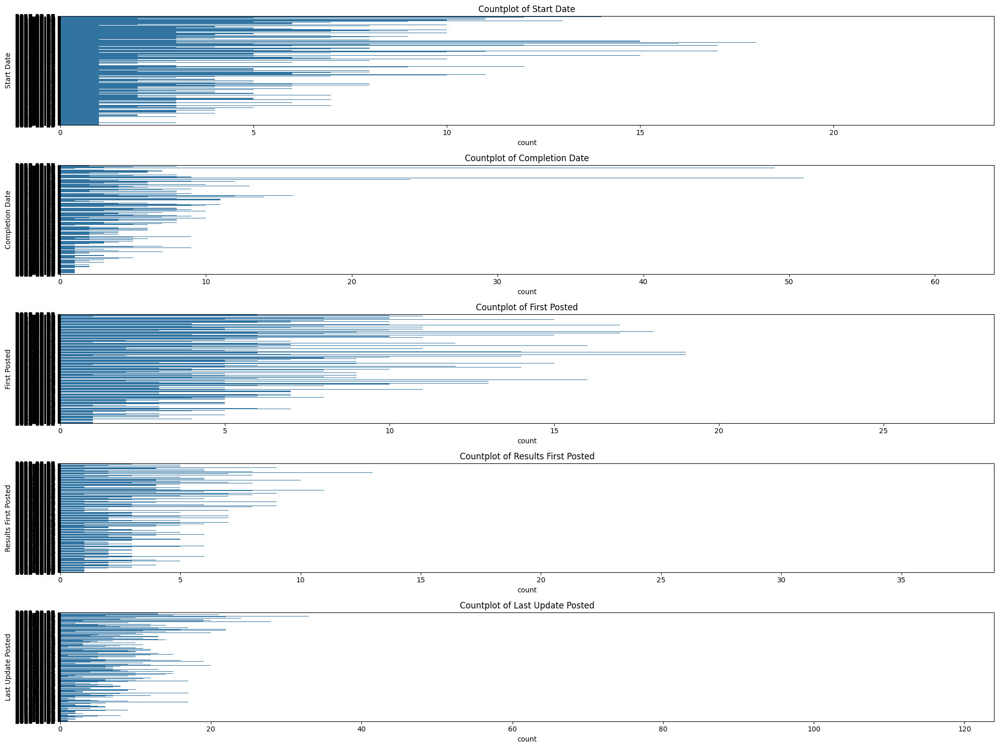

In [15]:
plt.figure(figsize=(20, 15))
for i, column in tqdm(enumerate(categorical_columns, 1), total=len(categorical_columns), desc="Generating Countplots"):
    plt.subplot(5, 1, i)
    sns.countplot(y=train_data[column])
    plt.title(f'Countplot of {column}')
plt.tight_layout()
plt.show()


The count plots show the distribution of dates for various stages of clinical trials. Most activities, such as starting, completing, and posting results, are concentrated in specific periods, indicating common timelines. The plots reveal patterns in how studies progress and report their findings over time.



Generating Distribution Plots:   0%|          | 0/45 [00:00<?, ?it/s]

Generating Distribution Plots: 100%|██████████| 45/45 [01:30<00:00,  2.02s/it]


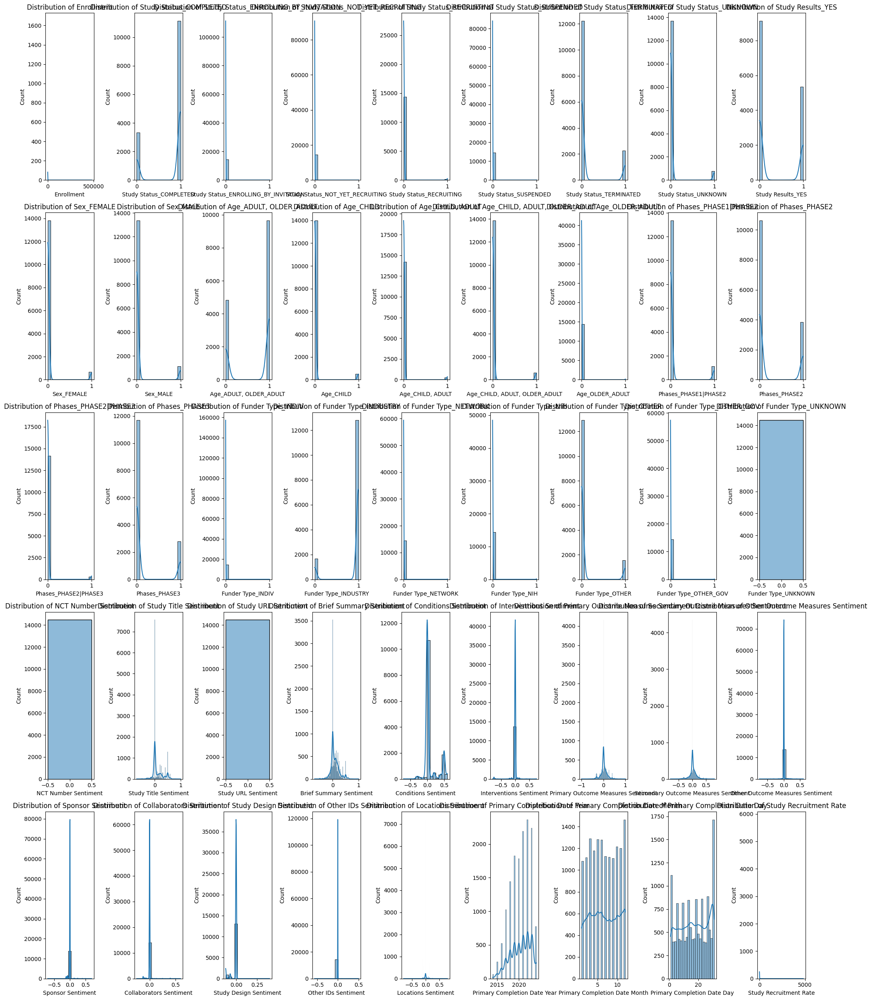

In [16]:
plt.figure(figsize=(20, 25))
for i, column in tqdm(enumerate(numeric_columns, 1), total=len(numeric_columns), desc="Generating Distribution Plots"):
    plt.subplot(5, 9, i)
    sns.histplot(train_data[column], kde=True)
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()


The distribution plots reveal that most variables are highly skewed, with many binary or categorical features showing a concentration of values at specific points. Sentiment scores are centered around zero, indicating neutrality, while enrollment and recruitment rates have a few extreme values, suggesting variability in study sizes and efficiencies.

Generating Scatter Plots: 100%|██████████| 45/45 [00:03<00:00, 12.35it/s]


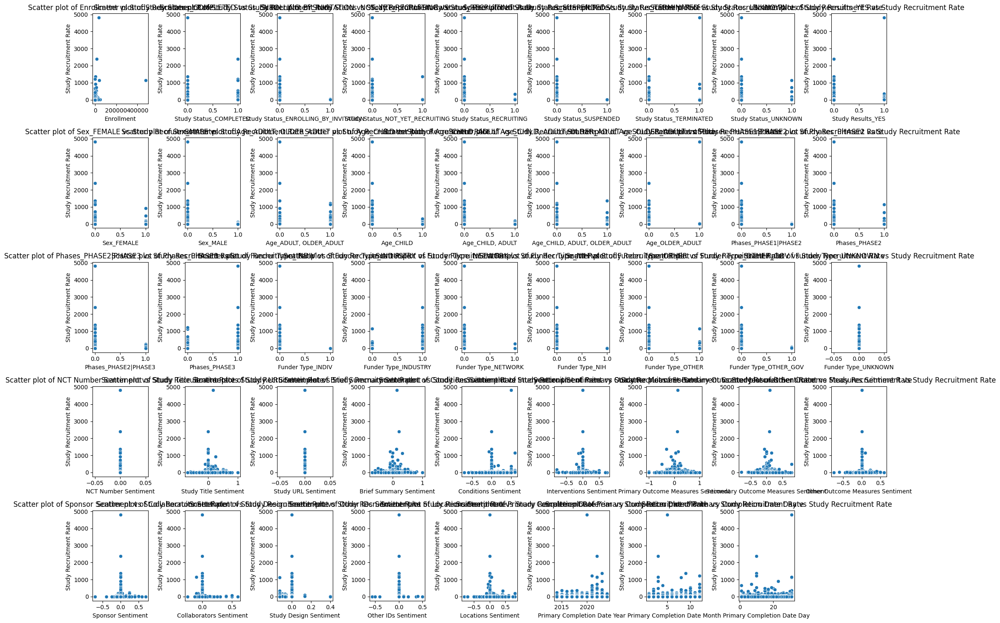

In [17]:
plt.figure(figsize=(20, 15))
for i, column in tqdm(enumerate(numeric_columns, 1), total=len(numeric_columns), desc="Generating Scatter Plots"):
    if column != 'Study Recruitment Rate':
        plt.subplot(5, 9, i)
        sns.scatterplot(x=train_data[column], y=train_data['Study Recruitment Rate'])
        plt.title(f'Scatter plot of {column} vs Study Recruitment Rate')
plt.tight_layout()
plt.show()

The scatter plots illustrate the relationship between study recruitment rates and various features. Most points are clustered at lower recruitment rates, with few high outliers. This suggests limited correlation between recruitment rates and other variables, indicating diverse factors influencing recruitment efficiency.



In [18]:
correlation_with_target = correlation_matrix['Study Recruitment Rate'].sort_values(ascending=False)
print("\nCorrelation with Study Recruitment Rate:")
print(correlation_with_target)


Correlation with Study Recruitment Rate:
Study Recruitment Rate                  1.000000
Enrollment                              0.260313
Age_OLDER_ADULT                         0.096120
Study Status_NOT_YET_RECRUITING         0.067610
Phases_PHASE3                           0.043784
Conditions Sentiment                    0.037308
Funder Type_INDUSTRY                    0.021910
Study Title Sentiment                   0.016643
Brief Summary Sentiment                 0.011077
Study Status_COMPLETED                  0.010859
Study Status_UNKNOWN                    0.010747
Sponsor Sentiment                       0.008135
Primary Completion Date Day             0.007230
Age_CHILD, ADULT, OLDER_ADULT           0.006518
Sex_MALE                                0.005512
Study Status_ENROLLING_BY_INVITATION    0.005467
Other Outcome Measures Sentiment        0.003131
Study Status_RECRUITING                 0.003089
Funder Type_NETWORK                     0.002017
Age_CHILD, ADULT           

Based on Plot detection there is a high need to detects outlier for which i am using iqr


In [19]:
print("\nOutlier detection using IQR:")
Q1 = train_data[numeric_columns].quantile(0.25)
Q3 = train_data[numeric_columns].quantile(0.75)
IQR = Q3 - Q1
outliers = ((train_data[numeric_columns] < (Q1 - 1.5 * IQR)) | (train_data[numeric_columns] > (Q3 + 1.5 * IQR))).sum()
print(outliers)


Outlier detection using IQR:
Enrollment                              1836
Study Status_COMPLETED                  3333
Study Status_ENROLLING_BY_INVITATION       8
Study Status_NOT_YET_RECRUITING           12
Study Status_RECRUITING                  130
Study Status_SUSPENDED                    14
Study Status_TERMINATED                 2254
Study Status_UNKNOWN                     786
Study Results_YES                          0
Sex_FEMALE                               667
Sex_MALE                                1116
Age_ADULT, OLDER_ADULT                     0
Age_CHILD                                494
Age_CHILD, ADULT                         264
Age_CHILD, ADULT, OLDER_ADULT            616
Age_OLDER_ADULT                           58
Phases_PHASE1|PHASE2                    1131
Phases_PHASE2                              0
Phases_PHASE2|PHASE3                     291
Phases_PHASE3                           2783
Funder Type_INDIV                          4
Funder Type_INDUSTRY     

In [20]:
plt.figure(figsize=(20, 15))
sns.pairplot(train_data[numeric_columns], diag_kind='kde')
plt.show()


<Figure size 2000x1500 with 0 Axes>

Such high diversity sow the need to make interaction features

Generating Plots: 100%|██████████| 45/45 [00:09<00:00,  4.51it/s]


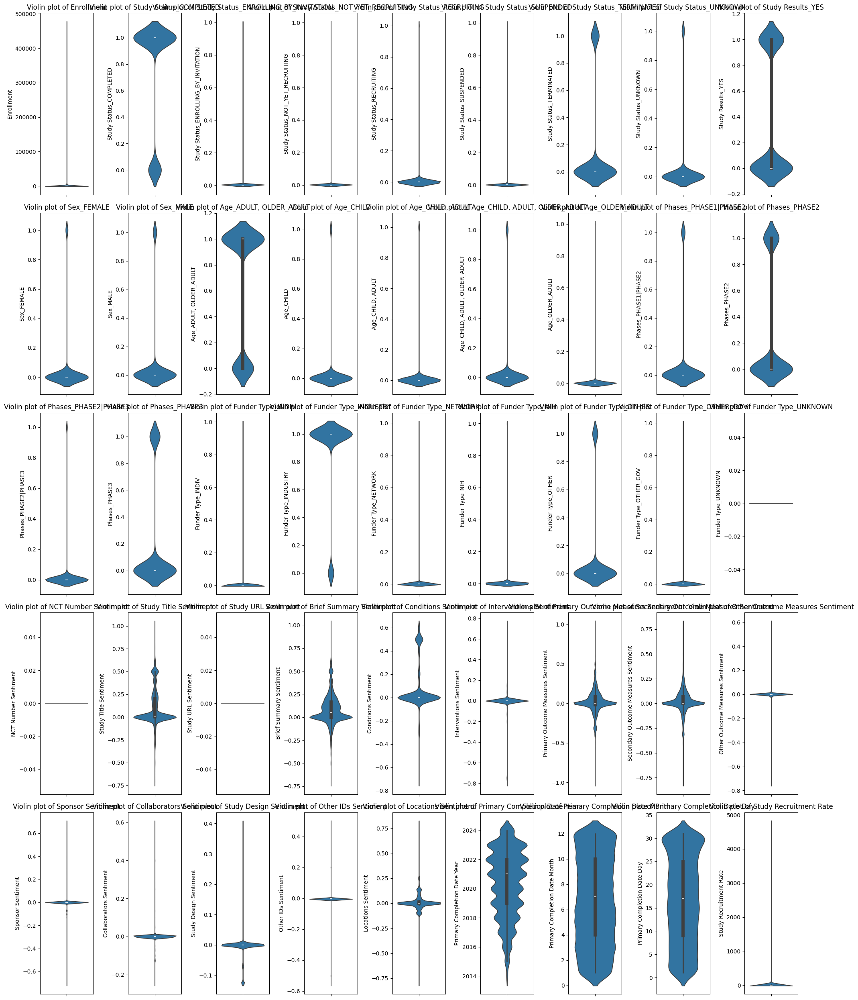

In [21]:
plt.figure(figsize=(20, 25))
for i, column in tqdm(enumerate(numeric_columns, 1), total=len(numeric_columns), desc="Generating Plots"):
    plt.subplot(5, 9, i)
    sns.violinplot(y=train_data[column])
    plt.title(f'Violin plot of {column}')
plt.tight_layout()
plt.show()

The violin plots display the distribution of various features, showing density and variability. Most features have concentrated values with some spread, indicating skewness or bimodal distributions. Sentiment scores are centered around zero, and primary completion dates show a clear yearly pattern.

Generating Joint Plots: 100%|██████████| 45/45 [19:38<00:00, 26.19s/it]  


<Figure size 2000x2500 with 0 Axes>

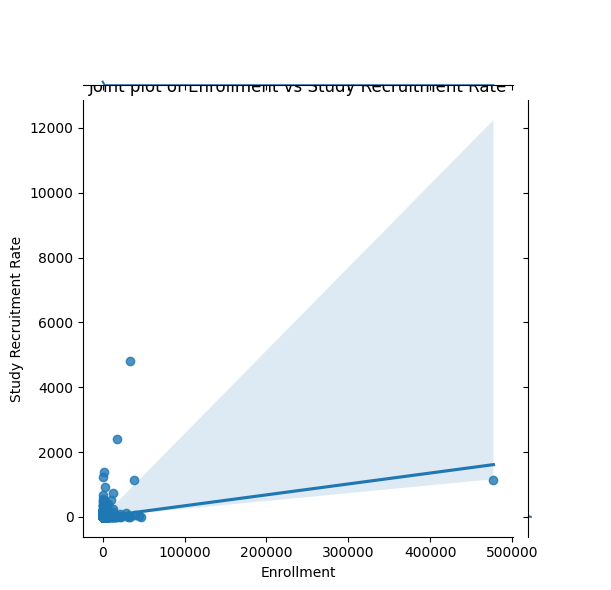

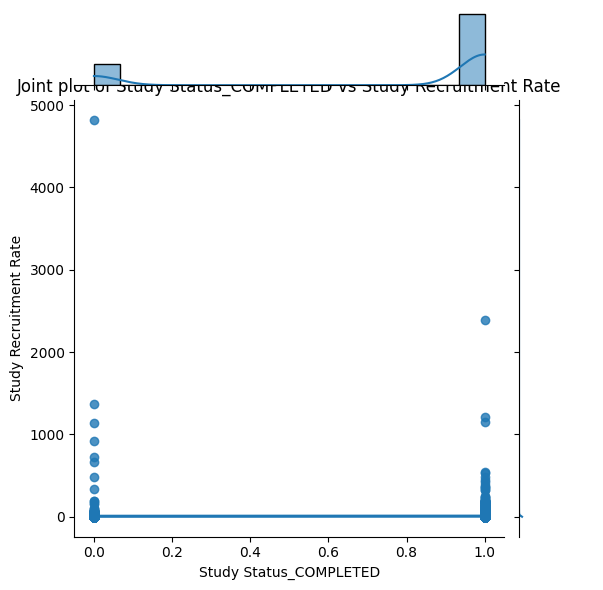

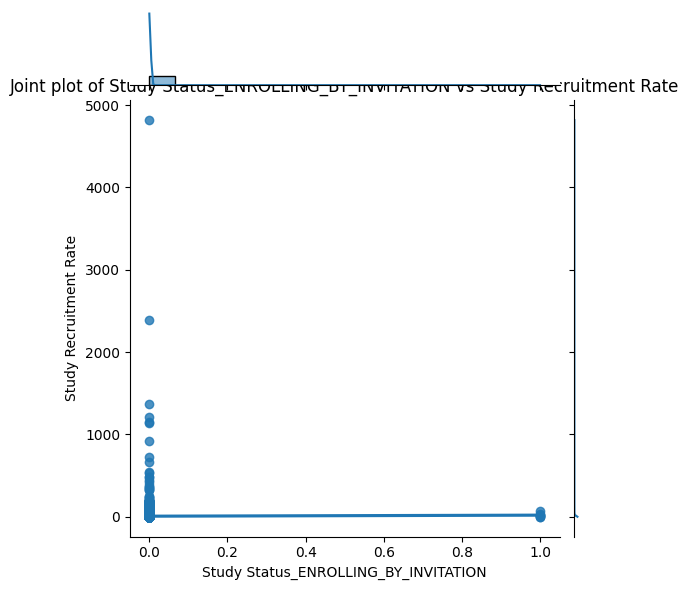

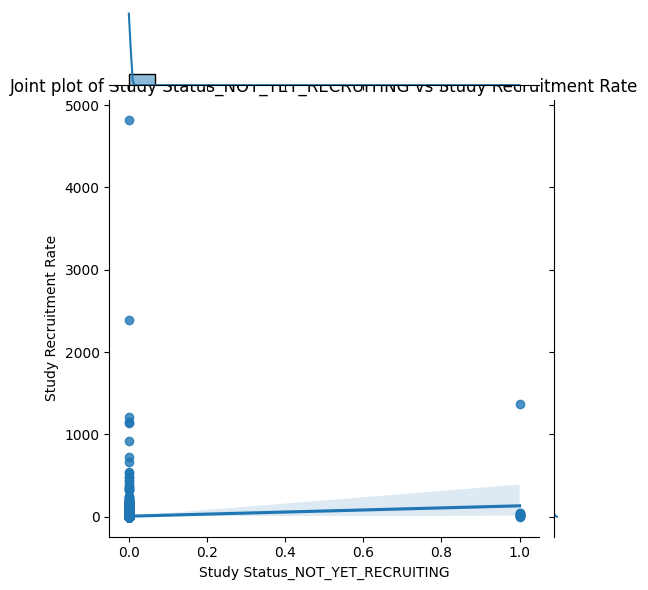

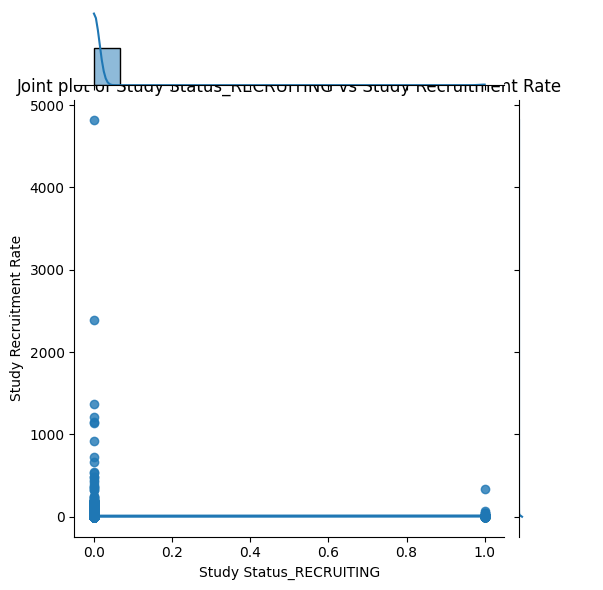

...

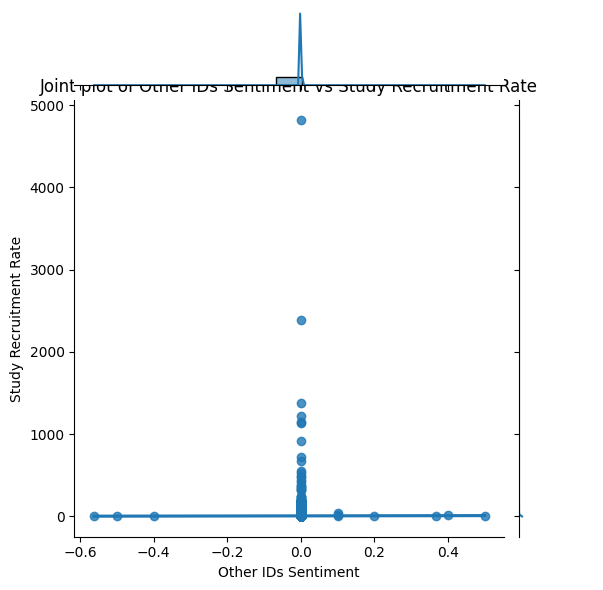

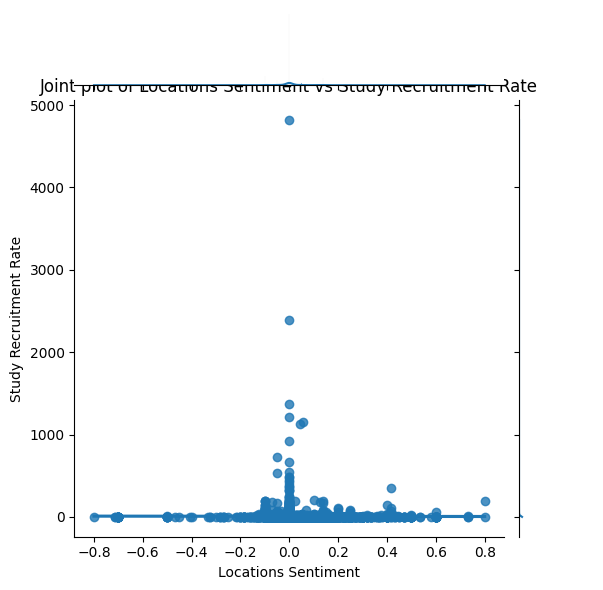

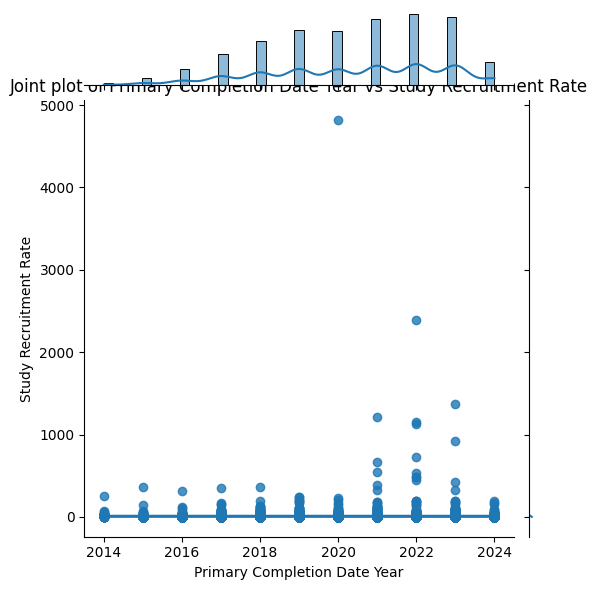

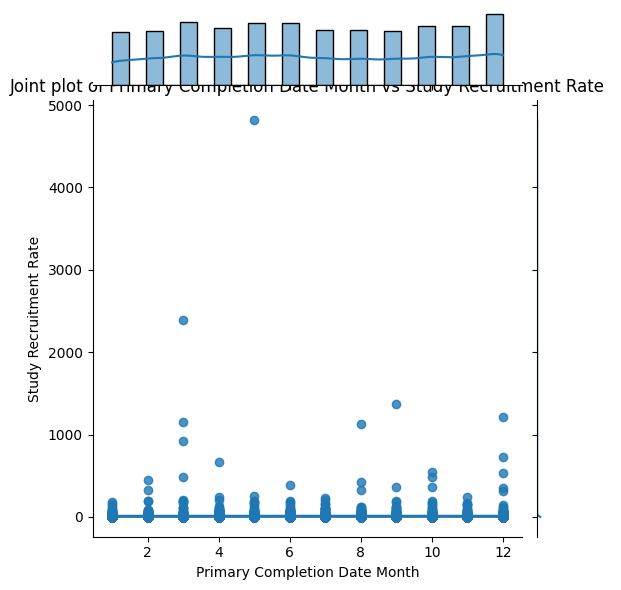

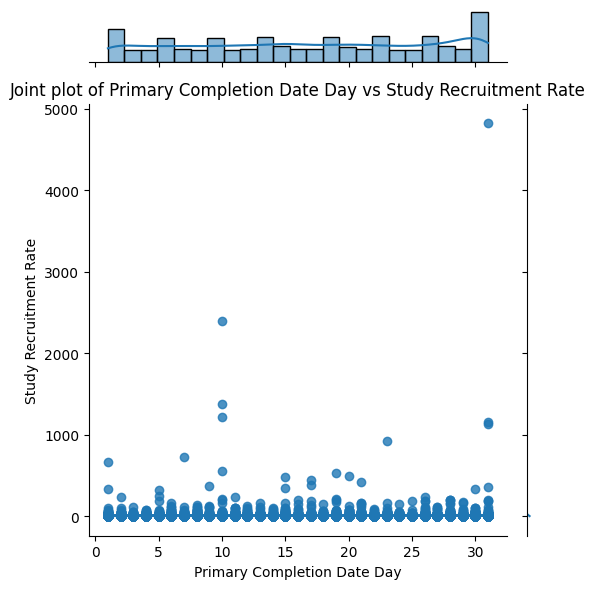

In [23]:
plt.figure(figsize=(20, 25))
for i, column in tqdm(enumerate(numeric_columns, 1), total=len(numeric_columns), desc="Generating Joint Plots"):
    if column != 'Study Recruitment Rate':
        sns.jointplot(x=train_data[column], y=train_data['Study Recruitment Rate'], kind='reg')
        plt.title(f'Joint plot of {column} vs Study Recruitment Rate')

plt.tight_layout()
plt.show()

shows some feature are highly imp in detecting study rec rate and gives a hint to inc their degree

Generating QQ Plots: 100%|██████████| 45/45 [00:01<00:00, 26.48it/s]


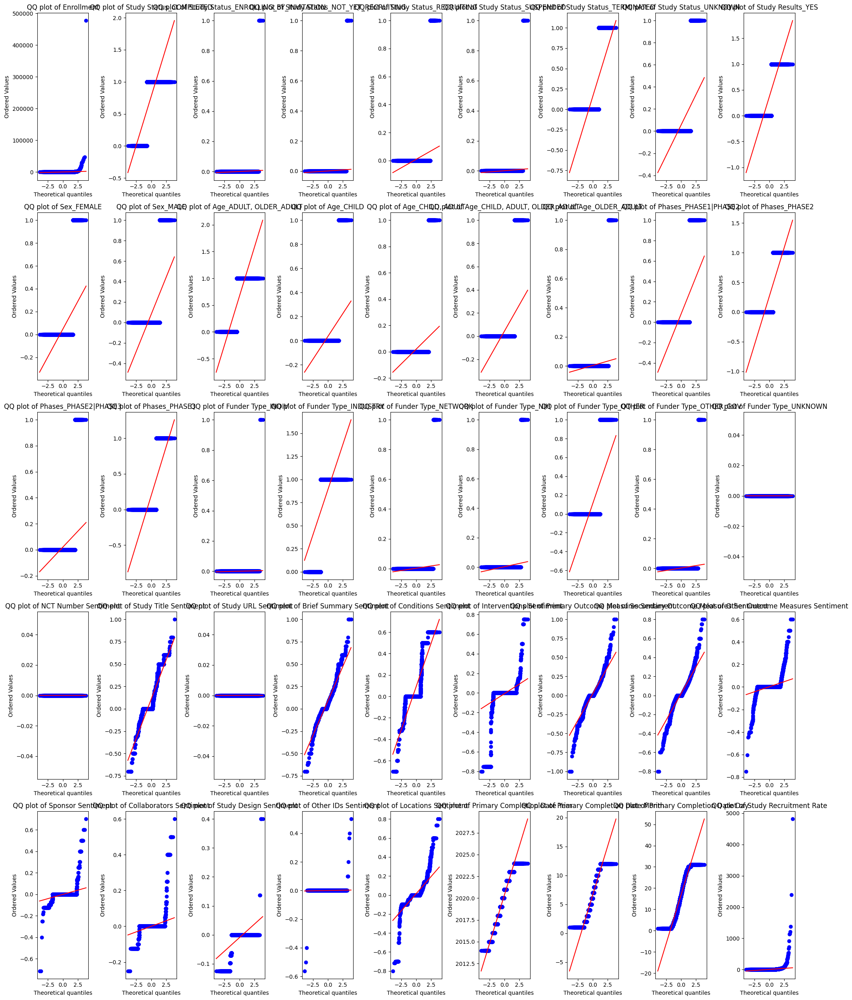

In [24]:
plt.figure(figsize=(20, 25))
for i, column in tqdm(enumerate(numeric_columns, 1), total=len(numeric_columns), desc="Generating QQ Plots"):
    plt.subplot(5, 9, i)
    stats.probplot(train_data[column], dist="norm", plot=plt)
    plt.title(f'QQ plot of {column}')

plt.tight_layout()
plt.show()

The Q-Q plots assess the normality of various features. Most plots show deviations from the red line, indicating that the data is not normally distributed. This suggests skewness or the presence of outliers in many features.

